In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from tensorflow_docs.vis import embed
import tensorflow as tf
from tensorflow import keras
from imutils import paths
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import imageio
import cv2
import os
from tqdm import tqdm
import math

In [11]:
train = pd.read_csv("/Users/pabloneira/AplicacionesTendenciasAD/train.csv", usecols=['title','rating'])

In [12]:
train['rating'] = train[['rating']].astype(str)
train

,title,rating
0,1_Patton Oswalt_ Annihilation _ Official Trail...,3
1,2_Speech .mp4,4
2,3_SUITS - Trailer Espa§ol(360p).mp4,4
3,4_The Forbidden Kingdom Trailer [HD].mp4,3
4,1922 _ Official Trailer [HD] _ Netflix.mp4,3
...,...,...
633,Redención ( Southpaw ) - Trailer español.mp4,4
634,[REC] · Trailer Oficial (Español).mp4,4
635,Día de Patriotas ( Patriots Day ) - Trailer es...,4
636,Troya - Trailer Oficial Español - encartelerao...,4


In [13]:
train3 = pd.read_csv("/Users/pabloneira/AplicacionesTendenciasAD/train_3.csv", usecols=['title','rating'])

In [14]:
train3['rating'] = train3[['rating']].astype(str)
train3

,title,rating
0,yt1s.com - La Casa de Papel Tráiler de la ser...,5
1,yt1s.com - La Casa de Papel Tráiler de la ser...,5
2,yt1s.com - La Casa de Papel Tráiler de la ser...,5
3,yt1s.com - La Casa de Papel Tráiler de la ser...,5
4,yt1s.com - La Casa de Papel Tráiler de la ser...,5
...,...,...
213,AMANECER - Parte 2 (La saga Crepúsculo) - Trai...,3
214,50 Sombras de Grey - Tráiler primer en Español...,3
215,2067 (2020) 🎥 Tráiler En ESPAÑOL (Subtitulado)...,3
216,2 Guns Trailer en Español (2013).mp4,3


In [15]:
train = pd.concat([train, train3], axis=0)
train

,title,rating
0,1_Patton Oswalt_ Annihilation _ Official Trail...,3
1,2_Speech .mp4,4
2,3_SUITS - Trailer Espa§ol(360p).mp4,4
3,4_The Forbidden Kingdom Trailer [HD].mp4,3
4,1922 _ Official Trailer [HD] _ Netflix.mp4,3
...,...,...
213,AMANECER - Parte 2 (La saga Crepúsculo) - Trai...,3
214,50 Sombras de Grey - Tráiler primer en Español...,3
215,2067 (2020) 🎥 Tráiler En ESPAÑOL (Subtitulado)...,3
216,2 Guns Trailer en Español (2013).mp4,3


In [17]:
test = pd.read_csv("/Users/pabloneira/AplicacionesTendenciasAD/test.csv", usecols=['title','rating'])

In [18]:
test['rating'] = test[['rating']].astype(str)
test

,title,rating
0,3_Tony Parker _ The Final Shot _ Bande-annonce...,3
1,Brothers (2009) Official Trailer .mp4,1
2,CAVE.mp4,2
3,Mumbai Delhi Mumbai - Official Trailer _ Starr...,1
4,Willy_guardians_lake.mp4,3
...,...,...
167,Revenge - Trailer español (HD).mp4,4
168,Grimm - Season 1 Trailer.mp4,4
169,True Blood - Season 1 Trailer - Official HBO U...,4
170,Bones (2001) - Official Trailer.mp4,4


In [99]:
def extract_tag(video_path):
    return video_path.split("/")[0]

def separate_video_name(video_name):
    return video_name.split("/")[1]

def rectify_video_name(video_name):
    return video_name.split(" ")[0]

def move_videos(df, output_dir):
    if not os.path.exists(output_dir):
        os.mkdir(output_dir)
    for i in tqdm(range(df.shape[0])):
        videoFile = df['title'][i].split("/")[-1]
        videoPath = os.path.join("data", videoFile)
        shutil.copy2(videoPath, output_dir)
    print()
    print(f"Total videos: {len(os.listdir(output_dir))}")

In [39]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 100

MAX_SEQ_LENGTH = 200
NUM_FEATURES = 2048

In [20]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]

In [21]:
def load_video(path, max_frames=200, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [22]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


feature_extractor = build_feature_extractor()

In [23]:
label_processor = keras.layers.StringLookup(
    num_oov_indices=0, vocabulary=np.unique(train["rating"])
)
print(label_processor.get_vocabulary())

['1', '2', '3', '4', '5']


In [24]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = df["title"].values.tolist()
    labels = df["rating"].values
    labels = label_processor(labels[..., None]).numpy()

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None,...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels


train_data, train_labels = prepare_all_videos(train, "/Volumes/NEIRA/AplicacionesTendenciasAD/video_train")
test_data, test_labels = prepare_all_videos(test, "/Volumes/NEIRA/AplicacionesTendenciasAD/video_test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (856, 200, 2048)
Frame masks in train set: (856, 200)


In [40]:
# Utility for our sequence model.
def get_sequence_model():
    class_vocab = label_processor.get_vocabulary()

    frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
    mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

    # Refer to the following tutorial to understand the significance of using `mask`:
    # https://keras.io/api/layers/recurrent_layers/gru/
    x = keras.layers.GRU(16, return_sequences=True)(
        frame_features_input, mask=mask_input
    )
    x = keras.layers.GRU(8)(x)
    x = keras.layers.Dropout(0.4)(x)
    x = keras.layers.Dense(8, activation="relu")(x)
    output = keras.layers.Dense(len(class_vocab), activation="softmax")(x)

    rnn_model = keras.Model([frame_features_input, mask_input], output)

    rnn_model.compile(
        loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"]
    )
    return rnn_model


# Utility for running experiments.
def run_experiment():
    filepath = "video_train"
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )

    seq_model = get_sequence_model()
    history = seq_model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_split=0.2,
        epochs=EPOCHS,
        callbacks=[checkpoint],
    )

    seq_model.load_weights(filepath)
    _, accuracy = seq_model.evaluate([train_data[0], train_data[1]], train_labels)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")

    return history, seq_model


_, sequence_model = run_experiment()

Epoch 1/100
22/22 [==============================] - 14s 353ms/step - loss: 1.5673 - accuracy: 0.2851 - val_loss: 1.9738 - val_accuracy: 0.0000e+00

Epoch 00001: val_loss improved from inf to 1.97376, saving model to video_train
Epoch 2/100
22/22 [==============================] - 6s 266ms/step - loss: 1.5475 - accuracy: 0.3056 - val_loss: 1.9964 - val_accuracy: 0.0000e+00

Epoch 00002: val_loss did not improve from 1.97376
Epoch 3/100
22/22 [==============================] - 6s 270ms/step - loss: 1.5414 - accuracy: 0.3143 - val_loss: 2.0456 - val_accuracy: 0.0000e+00

Epoch 00003: val_loss did not improve from 1.97376
Epoch 4/100
22/22 [==============================] - 6s 267ms/step - loss: 1.5413 - accuracy: 0.3026 - val_loss: 2.1597 - val_accuracy: 0.0000e+00

Epoch 00004: val_loss did not improve from 1.97376
Epoch 5/100
22/22 [==============================] - 6s 263ms/step - loss: 1.5517 - accuracy: 0.2822 - val_loss: 2.0249 - val_accuracy: 0.0000e+00

Epoch 00005: val_loss did 

22/22 [==============================] - 6s 263ms/step - loss: 0.7109 - accuracy: 0.7500 - val_loss: 3.4556 - val_accuracy: 0.0058

Epoch 00042: val_loss did not improve from 1.97376
Epoch 43/100
22/22 [==============================] - 6s 263ms/step - loss: 0.6510 - accuracy: 0.7909 - val_loss: 4.1483 - val_accuracy: 0.0349

Epoch 00043: val_loss did not improve from 1.97376
Epoch 44/100
22/22 [==============================] - 6s 262ms/step - loss: 0.6976 - accuracy: 0.7471 - val_loss: 3.6191 - val_accuracy: 0.0407

Epoch 00044: val_loss did not improve from 1.97376
Epoch 45/100
22/22 [==============================] - 6s 263ms/step - loss: 0.6377 - accuracy: 0.7646 - val_loss: 4.4722 - val_accuracy: 0.0349

Epoch 00045: val_loss did not improve from 1.97376
Epoch 46/100
22/22 [==============================] - 6s 260ms/step - loss: 0.5957 - accuracy: 0.7822 - val_loss: 3.7840 - val_accuracy: 0.0349

Epoch 00046: val_loss did not improve from 1.97376
Epoch 47/100
22/22 [=============

22/22 [==============================] - 6s 263ms/step - loss: 0.3354 - accuracy: 0.8743 - val_loss: 4.3734 - val_accuracy: 0.0523

Epoch 00084: val_loss did not improve from 1.97376
Epoch 85/100
22/22 [==============================] - 6s 263ms/step - loss: 0.3598 - accuracy: 0.8845 - val_loss: 5.2509 - val_accuracy: 0.0581

Epoch 00085: val_loss did not improve from 1.97376
Epoch 86/100
22/22 [==============================] - 6s 263ms/step - loss: 0.4124 - accuracy: 0.8553 - val_loss: 5.1084 - val_accuracy: 0.0407

Epoch 00086: val_loss did not improve from 1.97376
Epoch 87/100
22/22 [==============================] - 6s 263ms/step - loss: 0.3950 - accuracy: 0.8363 - val_loss: 4.6692 - val_accuracy: 0.0640

Epoch 00087: val_loss did not improve from 1.97376
Epoch 88/100
22/22 [==============================] - 6s 262ms/step - loss: 0.3831 - accuracy: 0.8684 - val_loss: 4.5742 - val_accuracy: 0.0698

Epoch 00088: val_loss did not improve from 1.97376
Epoch 89/100
22/22 [=============

In [41]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

In [76]:
def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("/Volumes/NEIRA/AplicacionesTendenciasAD/video_train", path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = sequence_model.predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames

In [74]:
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

Test video path: Squid Game | Official Teaser .mp4
  2: 26.67%
  4: 25.94%
  5: 17.61%
  3: 14.93%
  1: 14.85%



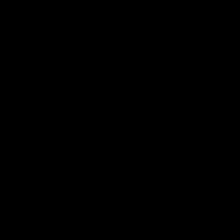

In [77]:
test_video = "Squid Game | Official Teaser .mp4"
print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])
#Mumbai Delhi Mumbai - Official Trailer _ Starring Shiv Pandit and Pia Bajpai _ 5th Dec, 2014.mp4

In [72]:
sequence_model.save("/Users/pabloneira/AplicacionesTendenciasAD/sequence_model.sav")

INFO:tensorflow:Assets written to: /Users/pabloneira/AplicacionesTendenciasAD/sequence_model.sav/assets


INFO:tensorflow:Assets written to: /Users/pabloneira/AplicacionesTendenciasAD/sequence_model.sav/assets
